In [1]:
!pip install git+https://github.com/openai/CLIP.git -q

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.4 MB/s eta 0:00:00


# Сборный проект-4
Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

###  Описание данных
Данные доступны по ссылке.

В файле train_dataset.csv находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке train_images содержатся изображения для тренировки модели.

В файле CrowdAnnotations.tsv — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

Имя файла изображения.
Идентификатор описания.
Доля людей, подтвердивших, что описание соответствует изображению.
Количество человек, подтвердивших, что описание соответствует изображению.
Количество человек, подтвердивших, что описание не соответствует изображению.
В файле ExpertAnnotations.tsv содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

Имя файла изображения.
Идентификатор описания.
3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле test_queries.csv находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке test_images содержатся изображения для тестирования модели.

## Импорты

In [2]:
import os
import random

import clip
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from catboost import CatBoostRegressor
from PIL import Image
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import GroupShuffleSplit
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.models import ResNet18_Weights
from tqdm import tqdm
from transformers import BertModel, BertTokenizer

In [3]:
# вынесем константы
RANDOM_STATE = 42
DIR_PATH = "/kaggle/input/to_upload/"
# список стоп-слов для блокировки изображений с несовершеннолетними
AGE_RELATED_WORDS = [
    "teen", "teens", "teenager", "teenagers", "child", "children", "kid", "kids", 
    "minor", "minors", "underage", "young", "juvenile", "juveniles", "infant", 
    "infants", "toddler", "toddlers", "baby", "babies", "preteen", "preteens", 
    "adolescent", "adolescents", "schoolgirl", "schoolgirls", "schoolboy", 
    "schoolboys", "youngling", "younglings", "kiddo", "kiddos", 
    "youngster", "youngsters", "youth", "youths", "pubescent", "prepubescent", 
    "minority", "immature", "underaged", "younger", "youngest", "childhood", 
    "adolescence", "tween", "tweens", "pre-teen", "pre-teens", "preteenager", 
    "preteenagers", "younger", "youngest", "childlike", "childish", "juvenility", 
    "minorhood", "youngish", "parent","parents", "mom", "moms", "dad",
    "mother", "father", "nanny", "babysitter","nursery", "girl", "girls", "boy",
    "boys",
]

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

### Загрузка и осмотр данных

In [5]:
count_train_img = [name for name in os.listdir(
    DIR_PATH + 'train_images') if os.path.isfile(
    os.path.join(DIR_PATH + 'train_images',name))]
print(f'Всего картинок в тренировочной выборке : {len(count_train_img)}')
print(f'Уникальных картинок в тренировочной выборке : {len(set(count_train_img))}')

Всего картинок в тренировочной выборке : 1000
Уникальных картинок в тренировочной выборке : 1000


In [6]:
count_test_img = [name for name in os.listdir(
    DIR_PATH + 'test_images') if os.path.isfile(
    os.path.join(DIR_PATH + 'test_images',name))]
print(f'Всего картинок в тестовой выборке : {len(count_test_img)}')
print(f'Уникальных картинок в тестовой выборке : {len(set(count_test_img))}')

Всего картинок в тестовой выборке : 100
Уникальных картинок в тестовой выборке : 100


In [7]:
print('Количество фотографий присутствующих в обеих выборках :',
      len(set(count_test_img) & set(count_train_img)))

Количество фотографий присутствующих в обеих выборках : 0


Изображения в тесте и трейне не пересекаются, картинки на месте можно начинать работу над проектом.

In [8]:
data_train = pd.read_csv(DIR_PATH + 'train_dataset.csv')

In [9]:
print('Первичный осмотр данных data_train')
print()
for column in data_train.columns:
    print(f'Уникальных значений в столбце {column}:',len(data_train[column].unique()))
print('Количество полных дубликатов в наблюдениях:',data_train.duplicated().sum())
print()
data_train.info()

Первичный осмотр данных data_train

Уникальных значений в столбце image: 1000
Уникальных значений в столбце query_id: 977
Уникальных значений в столбце query_text: 977
Количество полных дубликатов в наблюдениях: 0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


Итак, имеем 1000 картинок, как и в папке и 977 описаний. Возможно для каких то фото есть по нескольку релевантных описаний.

In [10]:
data_train.head(5)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [11]:
crow_annot =  pd.read_csv(DIR_PATH + 'CrowdAnnotations.tsv',
                          sep='\t', names=['image', 'query_id', 'c_score', 'c_pos', 'c_neg'])
crow_annot.head(5)

,image,query_id,c_score,c_pos,c_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [12]:
print('Первичный осмотр данных crow_annot')
print()
for column in crow_annot.columns:
    print(f'Уникальных значений в столбце {column}:',len(crow_annot[column].unique()))
print('Количество полных дубликатов в наблюдениях:',crow_annot.duplicated().sum())
print()
crow_annot.info()

Первичный осмотр данных crow_annot

Уникальных значений в столбце image: 1000
Уникальных значений в столбце query_id: 1000
Уникальных значений в столбце c_score: 12
Уникальных значений в столбце c_pos: 6
Уникальных значений в столбце c_neg: 7
Количество полных дубликатов в наблюдениях: 0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47830 non-null  object 
 1   query_id  47830 non-null  object 
 2   c_score   47830 non-null  float64
 3   c_pos     47830 non-null  int64  
 4   c_neg     47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


Рассмотрим отдельно сводную оценку краудсорсеров, отдельно рассматривать негативные и позитивные оценки большого смысла не вижу.

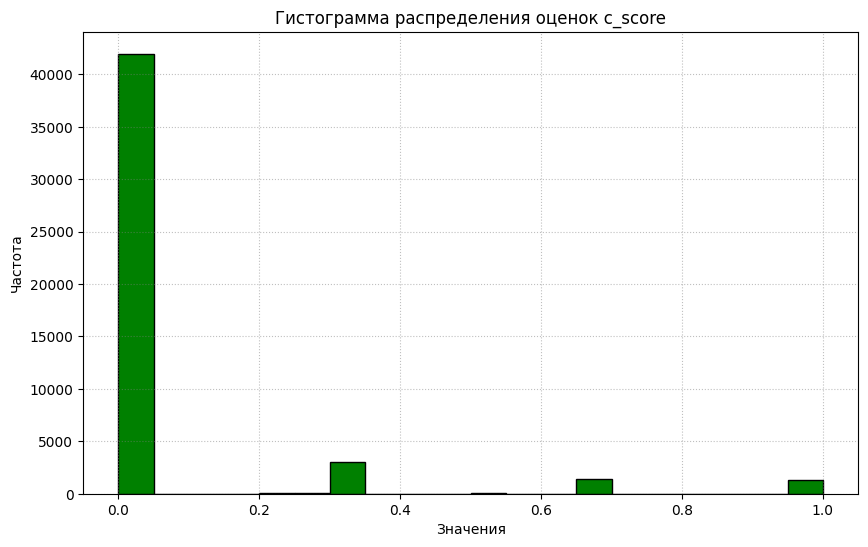

Краткий анализ переменной c_score:
count    47830.000000
mean         0.068786
std          0.207532
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: c_score, dtype: float64



In [13]:
plt.figure(figsize=(10, 6))
plt.hist(x=crow_annot.c_score, bins=20, color='g', edgecolor='black')
plt.title('Гистограмма распределения оценок c_score')
plt.xlabel('Значения')
plt.ylabel('Частота')
plt.grid(True, linestyle=':', color='gray', alpha=0.5) 
plt.show();
print('Краткий анализ переменной c_score:')
print(crow_annot.c_score.describe())
print()

На 1000 фотографий почти 48 тысяч вариаций фото-описание. Большая часть из них естественно неподходящая, основная оценка это 0 и среднее около 0.07, выглядит удручающе на таких данных модель учить будет сложно. Но описаний больше, чем в экспертном датасете, для каждой картинки видимо есть свое.

In [14]:
ex_annot =  pd.read_csv(DIR_PATH + 'ExpertAnnotations.tsv',
                          sep='\t', names=['image', 'query_id', 'ex_1', 'ex_2', 'ex_3'])
ex_annot.head(5)

,image,query_id,ex_1,ex_2,ex_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [15]:
print('Первичный осмотр данных ex_annot')
print()
for column in ex_annot.columns:
    print(f'Уникальных значений в столбце {column}:',len(ex_annot[column].unique()))
print('Количество полных дубликатов в наблюдениях:',ex_annot.duplicated().sum())
print()
ex_annot.info()

Первичный осмотр данных ex_annot

Уникальных значений в столбце image: 1000
Уникальных значений в столбце query_id: 977
Уникальных значений в столбце ex_1: 4
Уникальных значений в столбце ex_2: 4
Уникальных значений в столбце ex_3: 4
Количество полных дубликатов в наблюдениях: 0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   ex_1      5822 non-null   int64 
 3   ex_2      5822 non-null   int64 
 4   ex_3      5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


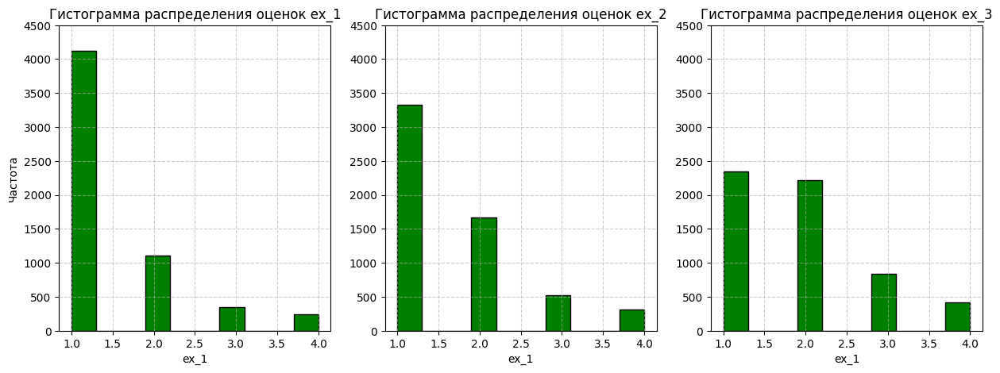

In [16]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5)) 
axes[0].hist(ex_annot.ex_1, color='g', edgecolor='black')
axes[0].set_title('Гистограмма распределения оценок ex_1')
axes[0].set_xlabel('ex_1')
axes[0].set_ylabel('Частота')
axes[0].grid(True, linestyle='--', alpha=0.6)

axes[1].hist(ex_annot.ex_2, color='g', edgecolor='black')
axes[1].set_title('Гистограмма распределения оценок ex_2')
axes[1].set_xlabel('ex_1')
axes[1].grid(True, linestyle='--', alpha=0.6)

axes[2].hist(ex_annot.ex_3, color='g', edgecolor='black')
axes[2].set_title('Гистограмма распределения оценок ex_3')
axes[2].set_xlabel('ex_1')
axes[2].grid(True, linestyle='--', alpha=0.6)

y_min = 0
y_max = 4500
for ax in axes:
    ax.set_ylim(y_min, y_max)

plt.show();

In [17]:
for c in ['ex_1', 'ex_2', 'ex_3']:
    print(f'Краткий анализ переменной {c}:')
    print(ex_annot[c].describe())
    print()

Краткий анализ переменной ex_1:
count    5822.000000
mean        1.436620
std         0.787084
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         4.000000
Name: ex_1, dtype: float64

Краткий анализ переменной ex_2:
count    5822.000000
mean        1.624356
std         0.856222
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         4.000000
Name: ex_2, dtype: float64

Краткий анализ переменной ex_3:
count    5822.000000
mean        1.881999
std         0.904087
min         1.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: ex_3, dtype: float64



Количество отзывов и изображений как и в тренировочном датасете (train_dataset), оценка 1 так же самая частая(полное несоответствие картинки и описания) но соотношение уже лучше (от 70 до 40%) в зависимости от эксперта. Вариантов сочетаний в 8 раз меньше, чем у краудсорсеров. Да и шкала оценки для обучения модели выглядит лучше (есть вариативный разброс, что изображение частично похоже.)

In [18]:
test_queries_data = pd.read_csv(DIR_PATH + 'test_queries.csv', sep='|')

In [19]:
print('Первичный осмотр данных test_queries_data')
print()
for column in test_queries_data.columns:
    print(f'Уникальных значений в столбце {column}:',len(test_queries_data[column].unique()))
print('Количество полных дубликатов в наблюдениях:',test_queries_data.duplicated().sum())
print()
test_queries_data.info()

Первичный осмотр данных test_queries_data

Уникальных значений в столбце Unnamed: 0: 500
Уникальных значений в столбце query_id: 500
Уникальных значений в столбце query_text: 500
Уникальных значений в столбце image: 100
Количество полных дубликатов в наблюдениях: 0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB


500 описаний подходящих к 100 картинкам из папки test. Пропусков и дубликатов нет.

**Промежуточные выводы:**
- изображения в в папках трейн и тест найдены,
- полных дубликатов среди всех дасетов не обнаружено, пропусков тоже,
- целевая переменная точно не определена, стоит рассмотреть оценки краудсорсеров и экпертов внимательнее, что бы понять их точность,
- на данный момент можем предположить что модель будет сложно обучаться, так так низких оценок и не подходящих изображений значительно больше.

### Анализ и преобработка данных

Так как по заданию целевая переменная должна быть в диапазоне [0,1], приведем к этому диапазону экспертную оценку (краудсор-оценка уже нормализована.)

In [20]:
ex_annot['ex_score'] = ((ex_annot.ex_1+ex_annot.ex_2+ex_annot.ex_3)/3-1)/3

ex_annot.head()

,image,query_id,ex_1,ex_2,ex_3,ex_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.111111
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.111111
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.222222
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.111111


Рассмотрим как оценивают одинаковые изображение эксперты и краудсорсеры.

In [21]:
df_sample = pd.merge(ex_annot[['image', 'query_id','ex_score']],
                     crow_annot[['image', 'query_id','c_score']],
                     on=['image', 'query_id'], how='inner')
display(df_sample.head())
df_sample.info()

,image,query_id,ex_score,c_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.111111,0.000000
2,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,0.111111,0.000000
3,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,0.333333,0.000000
4,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,0.555556,0.333333


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2329 entries, 0 to 2328
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     2329 non-null   object 
 1   query_id  2329 non-null   object 
 2   ex_score  2329 non-null   float64
 3   c_score   2329 non-null   float64
dtypes: float64(2), object(2)
memory usage: 72.9+ KB


In [22]:
df_sample = df_sample.merge(data_train,on=['image', 'query_id'], how='inner')
display(df_sample.head())
df_sample.info()

,image,query_id,ex_score,c_score,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,0.000000,A young child is wearing blue goggles and sitt...
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.111111,0.000000,A girl wearing a yellow shirt and sunglasses s...
2,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,0.111111,0.000000,A man and woman look back at the camera while ...
3,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,0.333333,0.000000,A crowd of people at an outdoor event
4,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,0.555556,0.333333,Close-up of dog in profile with mouth open .


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2329 entries, 0 to 2328
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       2329 non-null   object 
 1   query_id    2329 non-null   object 
 2   ex_score    2329 non-null   float64
 3   c_score     2329 non-null   float64
 4   query_text  2329 non-null   object 
dtypes: float64(2), object(3)
memory usage: 91.1+ KB


In [23]:
df_sample['label'] = (df_sample.query_text + 
                      ' - c_score -  ' + df_sample.c_score.astype(str) + 
                      ' - ex_score -  ' + df_sample.ex_score.astype(str))
df_sample.head()

,image,query_id,ex_score,c_score,query_text,label
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,0.000000,A young child is wearing blue goggles and sitt...,A young child is wearing blue goggles and sitt...
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.111111,0.000000,A girl wearing a yellow shirt and sunglasses s...,A girl wearing a yellow shirt and sunglasses s...
2,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,0.111111,0.000000,A man and woman look back at the camera while ...,A man and woman look back at the camera while ...
3,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,0.333333,0.000000,A crowd of people at an outdoor event,A crowd of people at an outdoor event - c_scor...
4,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,0.555556,0.333333,Close-up of dog in profile with mouth open .,Close-up of dog in profile with mouth open . -...


In [24]:
sample_image_datagen = ImageDataGenerator(rescale=1./255)
sample_image_flow = sample_image_datagen.flow_from_dataframe(
        dataframe= df_sample,
        directory=DIR_PATH + 'train_images',
        x_col='image',
        y_col='label',
        target_size=(224, 224),
        batch_size=32,
        class_mode='raw',
        seed=RANDOM_STATE)

Found 2329 validated image filenames.


In [25]:
features, targets = next(sample_image_flow) 
features.shape, targets.shape

((32, 224, 224, 3), (32,))

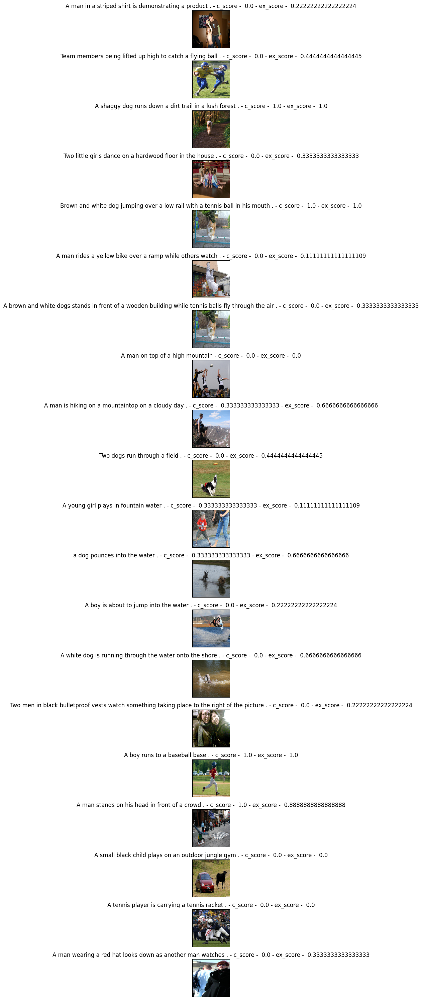

In [26]:
fig = plt.figure(figsize=(30,30))
for i in range(20):
    fig.add_subplot(20, 1, i+1)
    plt.title(targets[i])
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Итак, визуальный осмотр показывает, что экспертная оценка для модели будет болеее инофрмативна, так как учитывается не только полное соответствие, но общая специфика изображения. Для начала обучения модели подобного рода это будет более успешной практикой начать с датасетом с более точной разметкой и меньшим перекосом в оценках.

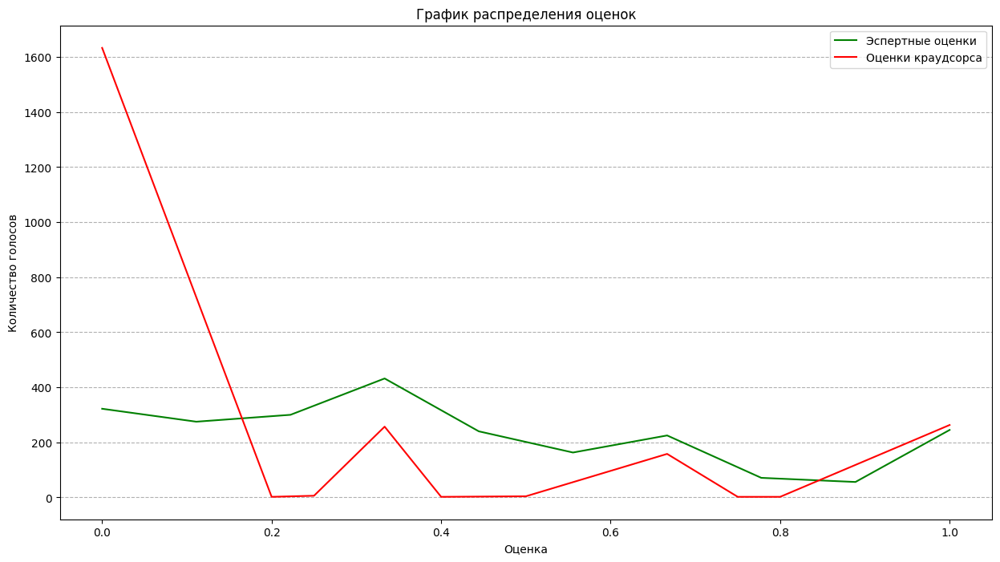

In [27]:

df_sample['ex_score'].value_counts().sort_index().plot(figsize=(15, 8),
                                                       label='Эспертные оценки',
                                                       color='g')
df_sample['c_score'].value_counts().sort_index().plot(label='Оценки краудсорса',
                                                      color='r')
plt.grid(True, axis='y', linestyle='--')
plt.legend()
plt.title('График распределения оценок')
plt.xlabel('Оценка')
plt.ylabel('Количество голосов')
plt.show()

По графику среза одинаковых изображений так же видно, что график экспертных оценок более плавный, нет такого количества 0 оценок и резких всплексов, поэтому считаю возможным начать обучение модели тоолько с датасетом экспертных оценок, отложив краудсорсинговые для дальнейшего исследования.

Датасет для дальнейшей работы соствим из описаний и изображений файла train_dataset и нормализованной экспертной оценки.

In [28]:
final_data = pd.merge(data_train,
                      ex_annot[['image', 'query_id','ex_score']],
                      on=['image', 'query_id'])
display(final_data.head())
final_data.info()

,image,query_id,query_text,ex_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.222222
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   ex_score    5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


**Промежуточные выводы:**
- обьединили тренировочные данные с нормализованной экспертной оценкой для дальнейшего моделирования,
- оценки краудсорсеров применять для модели на данном этапе исследования не вижу смысла(добиться точности предсказаний и так не будет легко, а с крупным перекосом в сторону 0 модель может и совсем не обучиться искать релевантные изображения),
- получили датасет из 5822 строк для дальнейшей очистки.

## Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Фильтрацию будем проводить через поиск стоп-слов в запросах.Это не абсолютно эффективно(есть некоторые сомнения насчет двойственности определений girl - это девочка 3 лет и девушка около 20), но наименее затратно на данном этапе исследования.

In [29]:
data_for_filter = final_data[['query_id','query_text']].drop_duplicates()
data_for_filter.head()

,query_id,query_text
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
12,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...
22,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
27,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...
31,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .


In [30]:
def filter_age_words(query,age_related_words):
    query_words = query.lower().split()
    for word in query_words:
        if word in age_related_words:
            return 1
    return 0

In [31]:
data_for_filter['stop_words'] = data_for_filter['query_text'].apply(
    lambda x:filter_age_words(x,AGE_RELATED_WORDS))
data_for_filter.head()

,query_id,query_text,stop_words
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1
12,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1
22,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0
27,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,0
31,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0


In [32]:
image_to_drop = data_for_filter.query('stop_words==1')['query_id'].str[:-2].to_list()

Проверяем нашли ли мы картинки с детьми.

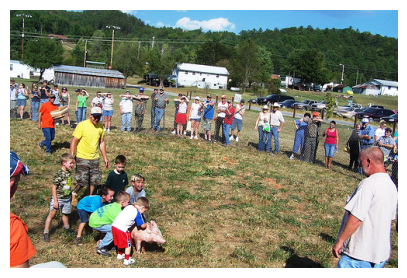

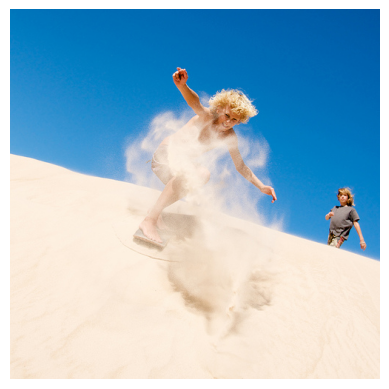

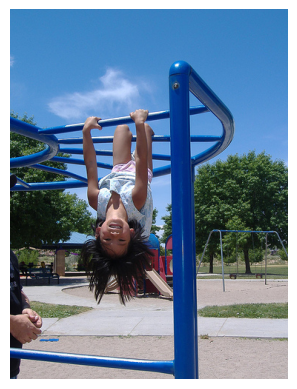

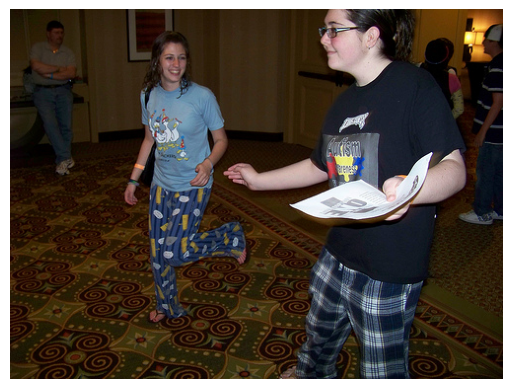

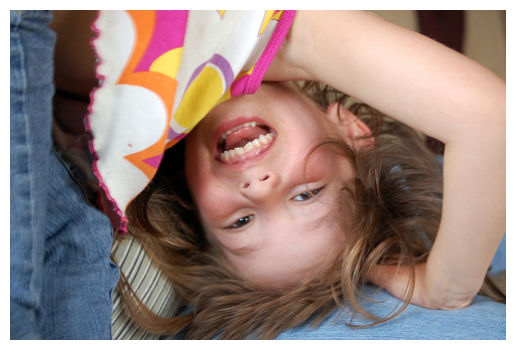

In [33]:
fig = plt.figure(figsize=(5,5))

for i in [random.choice(image_to_drop) for x in range(5)]:

    image = Image.open(DIR_PATH +'train_images/' + i)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

Удаляем неприемлемый контент из финальной выборки.

In [34]:
final_data = final_data.query('image not in @image_to_drop')
final_data.reset_index(drop=True, inplace=True)
display(final_data.head())
final_data.info()

,image,query_id,query_text,ex_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       3998 non-null   object 
 1   query_id    3998 non-null   object 
 2   query_text  3998 non-null   object 
 3   ex_score    3998 non-null   float64
dtypes: float64(1), object(3)
memory usage: 125.1+ KB


**Промежуточные выводы:**
- удалили фотографии с лизами младше 16 лет,
- получили итоговую выборку из 3998 строк.

## Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

### ResNet-18

In [35]:
# Загрузка предобученной модели ResNet-18
resnet18 = models.resnet18(weights=ResNet18_Weights.DEFAULT)

# Удаление полносвязных слоев (avgpool и fc)
resnet18 = torch.nn.Sequential(*list(resnet18.children()))[:-1]
resnet18.add_module("global_avg_pool", nn.AdaptiveAvgPool2d((1, 1)))  # Добавляем GAP

# Переводим модель в режим оценки (не обучаем)
resnet18.eval()
resnet18 = resnet18.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 186MB/s]


In [36]:
# Преобразования для изображений
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # ResNet-18 ожидает изображения 224x224
    transforms.ToTensor(),  # Преобразование в тензор
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Нормализация
])

def load_and_preprocess_image(image_path):
    """Загружает и предобрабатывает изображение."""
    image = Image.open(image_path).convert('RGB')  # Открываем изображение
    image = preprocess(image).unsqueeze(0)  # Добавляем batch dimension
    return image.to(device)



In [37]:
def extract_features(image_path, model):
    """Извлекает векторные представления из изображения."""
    image = load_and_preprocess_image(image_path)
    with torch.no_grad():  
        features = model(image)
    return features.squeeze().cpu().numpy()  # Убираем batch dimension и переводим в numpy

In [38]:
# Путь к папке с изображениями
image_folder = DIR_PATH + 'train_images'
# Список путей к изображениям, удаленные изображения рассматривать не будем
image_paths = [os.path.join(image_folder, img)
               for img in os.listdir(image_folder) if img not in image_to_drop]

In [39]:
def make_vector_image_df(image_paths, model):

    # Извлечение признаков и создание DataFrame
    features_list = []
    for img_path in tqdm(image_paths, desc="Векторизация изображений"):
        features = extract_features(img_path, model)
        features_list.append(features)

    vector_img = pd.DataFrame(features_list)

    # Собираем датафрейм для дальнейшего мерджа
    vector_img['image'] = [x.split('/')[-1] for x in image_paths]

    vector_img.columns = [(str(x)+'_img') for x in vector_img.columns]
    vector_img.rename(columns={'image_img':'image'}, inplace=True)
    return vector_img

In [40]:
vector_img = make_vector_image_df(image_paths, resnet18)

Векторизация изображений: 100%|██████████| 695/695 [00:42<00:00, 16.44it/s]


In [41]:
display(vector_img.head())
vector_img.info()

,0_img,1_img,2_img,3_img,4_img,5_img,6_img,7_img,8_img,9_img,...,503_img,504_img,505_img,506_img,507_img,508_img,509_img,510_img,511_img,image
0,1.342332,0.000446,1.231052,0.586054,0.971681,0.288977,1.339453,2.308214,1.703468,3.365381,...,0.772279,0.230982,0.309844,1.151774,0.902697,0.651249,1.453432,2.012361,0.146669,280706862_14c30d734a.jpg
1,0.837182,0.693366,0.437133,0.975123,0.234577,0.226061,0.130816,0.077838,0.234463,2.411164,...,0.409923,0.204277,0.471745,0.702060,0.987501,0.336574,1.309059,0.664482,0.153102,929679367_ff8c7df2ee.jpg
2,0.137150,0.699867,0.481627,1.420040,0.049735,0.067700,0.418888,1.025600,1.632500,0.456554,...,0.607959,0.270931,2.181211,0.217013,1.849328,1.346047,0.739610,0.182076,0.770696,3411393875_a9ff73c67a.jpg
3,0.431394,0.602178,0.274411,0.239170,1.071441,0.444774,0.215384,5.272691,1.023037,3.653803,...,0.259379,0.862756,1.476371,0.142457,0.817993,0.388412,0.875210,3.414166,0.499586,3619416477_9d18580a14.jpg
4,0.163106,1.105439,2.440159,0.800144,0.105252,0.336755,0.697400,1.575372,0.129866,1.793752,...,2.316694,2.135544,0.513953,0.303020,0.997992,1.276567,1.150165,0.795660,2.524510,506738508_327efdf9c3.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 695 entries, 0 to 694
Columns: 513 entries, 0_img to image
dtypes: float32(512), object(1)
memory usage: 1.4+ MB


**Промежуточные выводы:**
- изображения успешно векторизованы при помощи предобученной модели  ResNet-18 (кроме исключенных изображений с детьми),
- получен датасет из векторов размерностью (695, 513).

## Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.

### Bert

In [42]:
# Загрузка токенизатора и модели BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

# Переводим модель в режим оценки (не обучаем)
bert_model.eval()

# Проверка устройства (CPU или GPU)
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
bert_model = bert_model.to(device)

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [43]:
def vectorize_text(text, tokenizer, model, device):
    """
    Векторизует текст с помощью BERT.
    Возвращает усредненный вектор всех токенов.
    """
    # Токенизация текста
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True)
    inputs = {key: value.to(device) for key, value in inputs.items()}

    with torch.no_grad():
        outputs = model(**inputs)
    
    # Извлечение последнего скрытого состояния (последний слой BERT)
    last_hidden_state = outputs.last_hidden_state

    # Усреднение по токенам для получения одного вектора
    text_vector = last_hidden_state.mean(dim=1).squeeze().cpu().numpy()
    return text_vector

In [44]:
def make_vector_text_df(query_text, tokenizer, bert_model, device):
    text_vectors = [vectorize_text(text, tokenizer, bert_model, device)
                for text in tqdm(query_text, desc="Векторизация текстов")]
    # Создание DataFrame
    vector_text = pd.DataFrame(text_vectors)
    vector_text['query_text'] = query_text
    # Немного изменим названия столбцов для упрощения дальшейшего мерджа с изображениями
    vector_text.columns = [(str(x)+'_txt') for x in vector_text.columns]
    vector_text.rename(columns={'query_text_txt':'query_text'}, inplace=True)
    return vector_text

In [45]:
# достаем уникальные описания 
query_text = final_data.query_text.unique()

In [46]:
vector_text = make_vector_text_df(query_text, tokenizer, bert_model, device)

Векторизация текстов: 100%|██████████| 938/938 [00:55<00:00, 16.93it/s]


In [47]:
display(vector_text.head())
vector_text.info()

,0_txt,1_txt,2_txt,3_txt,4_txt,5_txt,6_txt,7_txt,8_txt,9_txt,...,759_txt,760_txt,761_txt,762_txt,763_txt,764_txt,765_txt,766_txt,767_txt,query_text
0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,-0.033609,0.683689,-0.097431,-0.075769,...,-0.201560,-0.493887,0.013434,-0.006957,-0.036318,0.237775,-0.176095,-0.013142,0.204745,A young child is wearing blue goggles and sitt...
1,0.501098,-0.245353,-0.134886,-0.144165,0.393155,-0.337638,0.014105,0.679082,0.014595,-0.563368,...,-0.129320,-0.044413,-0.062804,-0.202447,-0.078268,0.182695,-0.169717,0.003193,0.136546,A girl wearing a yellow shirt and sunglasses s...
2,0.495474,-0.220371,0.151327,0.021881,0.227644,0.036066,-0.071937,0.897265,-0.020503,-0.440497,...,-0.168477,-0.130826,0.050840,0.137441,0.234322,0.040068,-0.390364,0.070866,0.154537,A man sleeps under a blanket on a city street .
3,0.582396,-0.375534,0.024271,-0.022054,0.106668,-0.040799,-0.343040,0.530424,-0.515762,-0.104871,...,0.299615,-0.275095,0.257130,0.171889,0.109804,0.300465,-0.337860,-0.231128,0.203774,A woman plays with long red ribbons in an empt...
4,-0.313995,-0.310997,0.053889,-0.184099,0.538726,0.012341,0.062950,1.024061,-0.336021,-0.242609,...,-0.496596,0.196086,0.023435,0.058630,-0.225643,-0.428861,-0.376989,0.101353,-0.115983,Chinese market street in the winter time .


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 938 entries, 0 to 937
Columns: 769 entries, 0_txt to query_text
dtypes: float32(768), object(1)
memory usage: 2.8+ MB


**Промежуточные выводы:**
- тесктовые описания успешно веккторизованы с помощью модели Bert,
- получен датасет из векторов размерностью (769,938)

## Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [48]:
final_data = final_data.merge(vector_text, on='query_text', how='left')
display(final_data.head())
final_data.info()

,image,query_id,query_text,ex_score,0_txt,1_txt,2_txt,3_txt,4_txt,5_txt,...,758_txt,759_txt,760_txt,761_txt,762_txt,763_txt,764_txt,765_txt,766_txt,767_txt
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,-0.516456,-0.20156,-0.493887,0.013434,-0.006957,-0.036318,0.237775,-0.176095,-0.013142,0.204745
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,-0.516456,-0.20156,-0.493887,0.013434,-0.006957,-0.036318,0.237775,-0.176095,-0.013142,0.204745
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,-0.516456,-0.20156,-0.493887,0.013434,-0.006957,-0.036318,0.237775,-0.176095,-0.013142,0.204745
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,-0.516456,-0.20156,-0.493887,0.013434,-0.006957,-0.036318,0.237775,-0.176095,-0.013142,0.204745
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,-0.516456,-0.20156,-0.493887,0.013434,-0.006957,-0.036318,0.237775,-0.176095,-0.013142,0.204745


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Columns: 772 entries, image to 767_txt
dtypes: float32(768), float64(1), object(3)
memory usage: 11.8+ MB


In [49]:
final_data = final_data.merge(vector_img, on='image', how='left')
display(final_data.head())
final_data.info()

,image,query_id,query_text,ex_score,0_txt,1_txt,2_txt,3_txt,4_txt,5_txt,...,502_img,503_img,504_img,505_img,506_img,507_img,508_img,509_img,510_img,511_img
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,0.637314,0.219068,0.384109,1.079248,1.404970,0.688914,1.954878,0.161943,0.782139,0.064406
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,0.256124,0.382986,0.767398,0.958280,0.767115,1.413142,0.572110,0.650181,0.094199,1.365293
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,0.895655,0.469738,1.316281,1.893028,4.764876,0.763959,0.519450,1.884194,0.679976,1.014401
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,0.347749,1.025348,2.216003,0.370979,0.945541,1.724208,0.789453,3.455814,3.262314,1.381283
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,...,0.840911,1.082684,1.600406,0.373153,1.917664,0.534465,1.782733,1.351782,1.741966,0.824693


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Columns: 1284 entries, image to 511_img
dtypes: float32(1280), float64(1), object(3)
memory usage: 19.6+ MB


In [50]:
final_data_vector = final_data.drop(columns=['query_id','query_text'])
final_data_vector.head()

,image,ex_score,0_txt,1_txt,2_txt,3_txt,4_txt,5_txt,6_txt,7_txt,...,502_img,503_img,504_img,505_img,506_img,507_img,508_img,509_img,510_img,511_img
0,1056338697_4f7d7ce270.jpg,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,-0.033609,0.683689,...,0.637314,0.219068,0.384109,1.079248,1.404970,0.688914,1.954878,0.161943,0.782139,0.064406
1,1262583859_653f1469a9.jpg,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,-0.033609,0.683689,...,0.256124,0.382986,0.767398,0.958280,0.767115,1.413142,0.572110,0.650181,0.094199,1.365293
2,2621415349_ef1a7e73be.jpg,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,-0.033609,0.683689,...,0.895655,0.469738,1.316281,1.893028,4.764876,0.763959,0.519450,1.884194,0.679976,1.014401
3,3155451946_c0862c70cb.jpg,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,-0.033609,0.683689,...,0.347749,1.025348,2.216003,0.370979,0.945541,1.724208,0.789453,3.455814,3.262314,1.381283
4,3222041930_f642f49d28.jpg,0.0,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,-0.033609,0.683689,...,0.840911,1.082684,1.600406,0.373153,1.917664,0.534465,1.782733,1.351782,1.741966,0.824693


**Промежуточные выводы:**
- обьединили векторные представления фотографий и текстов,
- получен датасет для моделирования  из 3998 строк и 1282 колонок.

## Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

Как метрику качества используем **RMSE** — это квадратный корень из MSE. Она имеет ту же размерность, что и целевая переменная, что делает ее более интерпретируемой.
Плюсы:
-Легко интерпретируется.
-Учитывает большие ошибки.
Минусы:
-Чувствительна к выбросам.

Начнем с простой модели Ridge, рассмотрим RandomForestRegressor,CatBoostRegressor и попробуем построить свою нейросеть. Ориентироваться будем на базовую модель DummyRegressor - метрики наших моделй должны быть лучшче чем усреднение по датасету.

In [51]:
#DF для сравнений
df_scoring=pd.DataFrame(columns=['model', 'RMSE_train'])

### Разбиение на выборки

In [52]:
# Создадим объект GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.75, random_state=RANDOM_STATE)

# Выполним разбиение датасета на тренировочную и тестовую выборки
train_indices, test_indices = next(gss.split(X=final_data_vector.drop(
    columns=['ex_score','image']),
    y=final_data_vector['ex_score'],
    groups=final_data_vector['image']))

# Создадим тренировочный и тестовый датасеты
train_df, test_df = final_data_vector.loc[train_indices], final_data_vector.loc[test_indices]
print(train_df.shape, test_df.shape)

(2990, 1282) (1008, 1282)


In [53]:
X_train = train_df.drop(columns=['image', 'ex_score'])
y_train = train_df['ex_score']

X_valid = test_df.drop(columns=['image', 'ex_score'])
y_valid = test_df['ex_score']

### DummyRegressor

In [54]:
dummy_regressor = DummyRegressor()
dummy_regressor.fit(X_train, y_train)

dummy_pred = dummy_regressor.predict(X_valid)

dummy_rmse = mean_squared_error(y_valid, dummy_pred, squared=False)

print(f"RMSE базовой модели(среднее значение) = {round(dummy_rmse, 4)}")

RMSE базовой модели(среднее значение) = 0.2784


In [55]:
df_scoring.loc[len(df_scoring.index)]=('DummyRegressor', dummy_rmse)

Наша цель найти модель c RMSE значительно меньше чем 0.28.

### Ridge

In [56]:
# Обучение модели Ridge Regression
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)

ridge_pred=ridge_model.predict(X_valid)

ridge_rmse = mean_squared_error(y_valid, ridge_pred, squared=False)
print(f"RMSE Ridge = {round(ridge_rmse , 4)}")

RMSE Ridge = 0.4326


In [57]:
df_scoring.loc[len(df_scoring.index)]=('Ridge', ridge_rmse)

### RandomForestRegressor & CatBoostRegressor

In [58]:
model_rf = RandomForestRegressor(random_state=42)
model_rf.fit(X_train, y_train)

rf_pred=model_rf.predict(X_valid)

rf_rmse = mean_squared_error(y_valid, rf_pred, squared=False)
print(f"RMSE RandomForestRegressor = {round(rf_rmse , 4)}")

RMSE RandomForestRegressor = 0.243


In [59]:
df_scoring.loc[len(df_scoring.index)]=('RandomForestRegressor', rf_rmse)

In [60]:
model_cat = CatBoostRegressor(random_state=42, logging_level='Silent')
model_cat.fit(X_train, y_train)

cat_pred=model_cat.predict(X_valid)

cat_rmse = mean_squared_error(y_valid, cat_pred, squared=False)
print(f"RMSE CatBoostRegressor = {round(cat_rmse , 4)}")

RMSE CatBoostRegressor = 0.2243


In [61]:
df_scoring.loc[len(df_scoring.index)]=('CatBoostRegressor', cat_rmse)

### Нейросеть


In [62]:
# подготовка тензоров
X_train_t = torch.FloatTensor(np.array(X_train))
X_valid_t = torch.FloatTensor(np.array(X_valid))
y_train_t = torch.FloatTensor(np.array(y_train))
y_valid_t = torch.FloatTensor(np.array(y_valid))

In [63]:
class Net_one(nn.Module):
    def __init__(self, n_in_neurons,
                 n_hidden_neurons_1,
                 n_hidden_neurons_2,
                 n_hidden_neurons_3,
                 n_out_neurons):
        super(Net_one, self).__init__()
        
        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.bn1 = nn.BatchNorm1d(n_hidden_neurons_1)  
        self.act1 = nn.ReLU()
        self.dropout1 = nn.Dropout(0.4)
        
        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.bn2 = nn.BatchNorm1d(n_hidden_neurons_2)  
        self.act2 = nn.ReLU()
        self.dropout2 = nn.Dropout(0.4)
        
        self.fc3 = nn.Linear(n_hidden_neurons_2, n_hidden_neurons_3)
        self.bn3 = nn.BatchNorm1d(n_hidden_neurons_3)
        self.act3 = nn.ReLU()
        self.dropout3 = nn.Dropout(0.4)
        
        self.fc4 = nn.Linear(n_hidden_neurons_3, n_out_neurons)
        self.bn4 = nn.BatchNorm1d(n_out_neurons)  
        self.act4 = nn.Sigmoid()
        
    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)  
        x = self.act1(x) 
        x = self.dropout1(x)  
        
        x = self.fc2(x)
        x = self.bn2(x) 
        x = self.act2(x)  
        x = self.dropout2(x) 
        
        x = self.fc3(x)
        x = self.bn3(x) 
        x = self.act3(x)  
        x = self.dropout3(x)  
        
        x = self.fc4(x)
        x = self.bn4(x) 
        x = self.act4(x)
        
        return x

In [64]:
# зафиксируем количество нейронов как требуется в задании.
n_in_neurons = X_train_t.shape[1]
n_hidden_neurons_1 = 512
n_hidden_neurons_2 = 256
n_hidden_neurons_3 = 128
n_out_neurons = 1


In [65]:
net = Net_one(n_in_neurons,
              n_hidden_neurons_1,
              n_hidden_neurons_2,
              n_hidden_neurons_3,
              n_out_neurons)
optimizer = torch.optim.NAdam(net.parameters(), lr=1e-5, weight_decay=1e-5)
loss = nn.MSELoss()

dataset_train = torch.utils.data.TensorDataset(X_train_t, y_train_t)
dataset_valid = torch.utils.data.TensorDataset(X_valid_t, y_valid_t)

In [66]:
torch.manual_seed(2025)
torch.use_deterministic_algorithms(True)

train_dataloader = DataLoader(dataset_train, batch_size=300, shuffle=True, num_workers=0)
test_dataloader = DataLoader(dataset_valid, batch_size=300, num_workers=0)
    
num_epochs = 10000

    
for epoch in range(num_epochs):
    net.train()
    for batch in train_dataloader:
        data_train, temp_train = batch 
        optimizer.zero_grad()

        preds = net.forward(data_train).flatten()

        loss_value = torch.sqrt(loss(preds, temp_train))
        loss_value.backward()
        optimizer.step()
    
    if epoch % 200 == 0 or epoch == num_epochs - 1:
        predict_T = [] 
        with torch.no_grad():
            net.eval()
            for batch in test_dataloader:
                data_test, temp_test = batch

                test_preds = net.forward(data_test).flatten()
                predict_T.append(test_preds)
                RMSE_loss = torch.sqrt(loss(test_preds, temp_test))

        predict_T = torch.cat(predict_T).detach().numpy()
        RMSE = mean_squared_error(y_valid_t, predict_T,squared=False)
            
        print(f"Эпоха:{epoch}, RMSE на трейне: {RMSE_loss}")
        print(f"Эпоха:{epoch}, RMSE на валидационной выборке: {RMSE}")
        print()

Эпоха:0, RMSE на трейне: 0.3833368420600891
Эпоха:0, RMSE на валидационной выборке: 0.3803749084472656

Эпоха:200, RMSE на трейне: 0.35246285796165466
Эпоха:200, RMSE на валидационной выборке: 0.3508269786834717

Эпоха:400, RMSE на трейне: 0.3091045916080475
Эпоха:400, RMSE на валидационной выборке: 0.31888118386268616

Эпоха:600, RMSE на трейне: 0.2953140139579773
Эпоха:600, RMSE на валидационной выборке: 0.308405339717865

Эпоха:800, RMSE на трейне: 0.28398340940475464
Эпоха:800, RMSE на валидационной выборке: 0.29990655183792114

Эпоха:1000, RMSE на трейне: 0.27614626288414
Эпоха:1000, RMSE на валидационной выборке: 0.2939806580543518

Эпоха:1200, RMSE на трейне: 0.2698403000831604
Эпоха:1200, RMSE на валидационной выборке: 0.28986188769340515

Эпоха:1400, RMSE на трейне: 0.2654782831668854
Эпоха:1400, RMSE на валидационной выборке: 0.28518277406692505

Эпоха:1600, RMSE на трейне: 0.2611163556575775
Эпоха:1600, RMSE на валидационной выборке: 0.27967318892478943

Эпоха:1800, RMSE на 

In [67]:
df_scoring.loc[len(df_scoring.index)]=('НС', RMSE)

## Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [68]:
df_scoring

,model,RMSE_train
0,DummyRegressor,0.278394
1,Ridge,0.432553
2,RandomForestRegressor,0.242978
3,CatBoostRegressor,0.224343
4,НС,0.223331


Результаты выглядят не очень обнадеживающе, лучшая модель нейросеть лучше базовой всего лишь на 0,05.  Попробуем ее протестировать.

In [69]:
test_image_folder = DIR_PATH + 'test_images'
test_image_paths = [os.path.join(test_image_folder, img)
               for img in os.listdir(test_image_folder)]

In [70]:
test_vector_img = make_vector_image_df(test_image_paths, resnet18)

Векторизация изображений: 100%|██████████| 100/100 [00:06<00:00, 14.52it/s]


In [71]:
display(test_vector_img.head())
test_vector_img.info()

,0_img,1_img,2_img,3_img,4_img,5_img,6_img,7_img,8_img,9_img,...,503_img,504_img,505_img,506_img,507_img,508_img,509_img,510_img,511_img,image
0,0.469888,0.326583,1.398037,0.253826,1.057305,0.102311,1.310453,1.311527,0.560541,1.913688,...,0.928261,0.372784,1.138914,0.703130,0.072438,0.435862,0.421108,0.551007,0.230757,1319634306_816f21677f.jpg
1,0.865033,1.088439,0.779393,0.478113,0.330183,2.877803,0.317333,0.901236,0.953730,0.290098,...,1.269159,0.050193,0.755903,1.457997,0.020731,0.636795,1.953246,0.203619,2.141463,3163198309_bbfe504f0a.jpg
2,0.880887,1.682912,0.603759,0.179158,0.194255,0.163215,0.138253,0.256380,0.385985,1.447616,...,1.165268,0.571731,0.353535,0.040236,2.598255,0.072283,0.213678,2.549554,0.939744,2308256827_3c0a7d514d.jpg
3,2.149790,0.367003,0.431729,0.544866,1.451654,0.355262,0.359406,1.790626,0.721527,0.455711,...,0.855521,0.982541,0.290416,0.107853,1.064757,0.782758,5.030945,1.394887,1.462888,3119913014_688d4997d7.jpg
4,0.873914,0.936083,1.224385,1.199488,1.485506,0.528717,0.725651,5.305560,0.484378,0.064815,...,0.489094,1.479925,0.637655,0.489224,1.059063,0.111474,1.077865,5.325102,0.471706,3555573680_41c1540a86.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Columns: 513 entries, 0_img to image
dtypes: float32(512), object(1)
memory usage: 200.9+ KB


In [72]:
test_query_list = test_queries_data.query_text.sample(n=10).values
test_query_list

array(['Costumed performers stand onstage with their arms outstretched .',
       'The brown dog is wearing a black collar .',
       'a large man dozes off on the bus .',
       'A young girl is smiling in front of the camera at a park .',
       "A little girl with her hands in the air is sitting on a man 's back while he is laying on a blanket .",
       'a lone man sitting on a ledge that overlooks the beach',
       'A group of people playing instruments in the woods .',
       'There is an older white haired lady and a bulldog sitting on a tree stump .',
       'A playground with two children and an adult .',
       'A large bird spreading his wings in flight over a body of water .'],
      dtype=object)

In [73]:
test_texts=[]
for text in test_query_list:
    if not filter_age_words(text,AGE_RELATED_WORDS):
        test_texts.append(text)
test_texts

['Costumed performers stand onstage with their arms outstretched .',
 'The brown dog is wearing a black collar .',
 'a large man dozes off on the bus .',
 'a lone man sitting on a ledge that overlooks the beach',
 'A group of people playing instruments in the woods .',
 'There is an older white haired lady and a bulldog sitting on a tree stump .',
 'A large bird spreading his wings in flight over a body of water .']

Векторизация текстов: 100%|██████████| 7/7 [00:00<00:00, 18.36it/s]


Описание : Costumed performers stand onstage with their arms outstretched .

Оценка: 0.3594312


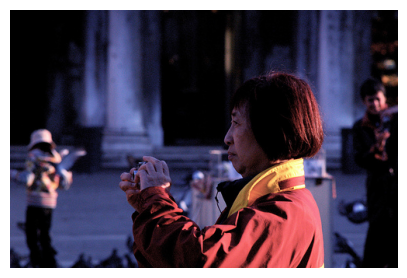

Искомое изображение


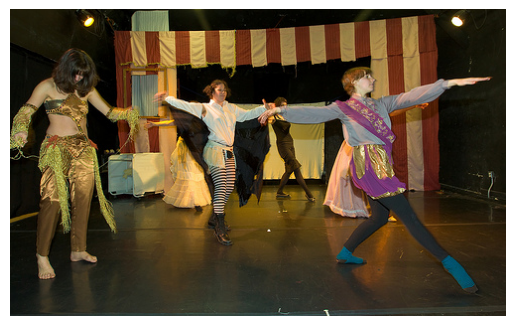

Описание : The brown dog is wearing a black collar .

Оценка: 0.40270206


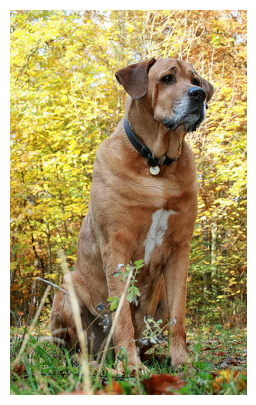

Искомое изображение


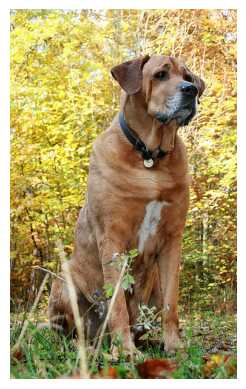

Описание : a large man dozes off on the bus .

Оценка: 0.32262337


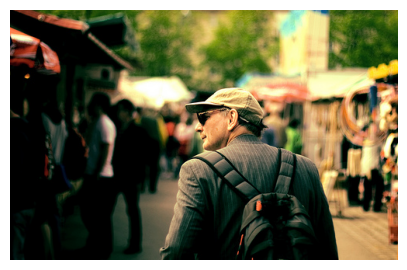

Искомое изображение


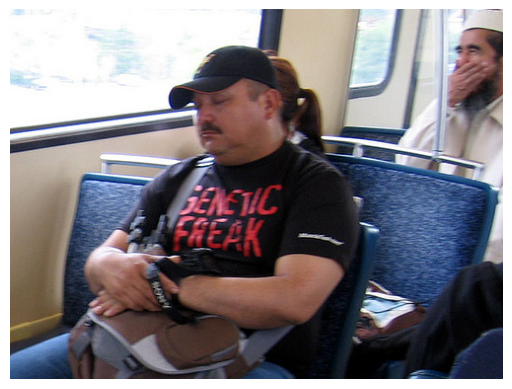

Описание : A young girl is smiling in front of the camera at a park .

This image is unavailable in your country in compliance with local laws

Описание : A little girl with her hands in the air is sitting on a man 's back while he is laying on a blanket .

This image is unavailable in your country in compliance with local laws

Описание : a lone man sitting on a ledge that overlooks the beach

Оценка: 0.40256825


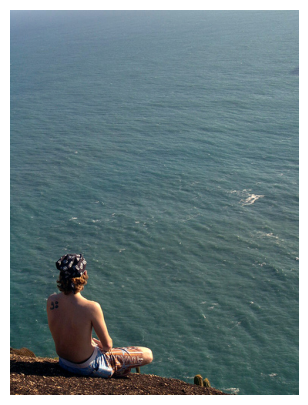

Искомое изображение


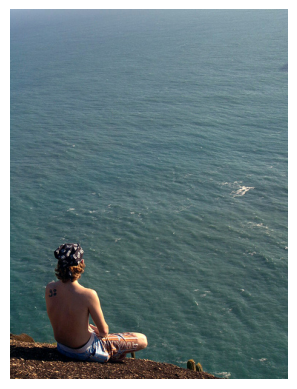

Описание : A group of people playing instruments in the woods .

Оценка: 0.43164927


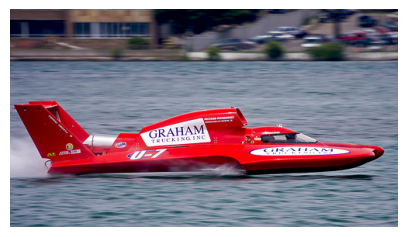

Искомое изображение


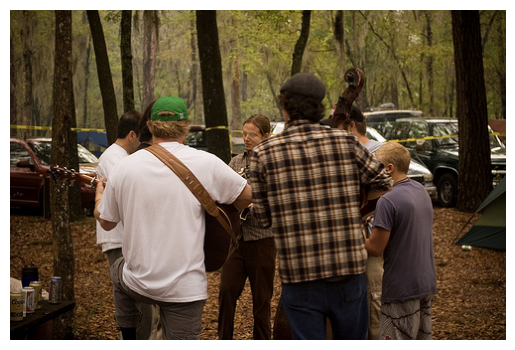

Описание : There is an older white haired lady and a bulldog sitting on a tree stump .

Оценка: 0.3672153


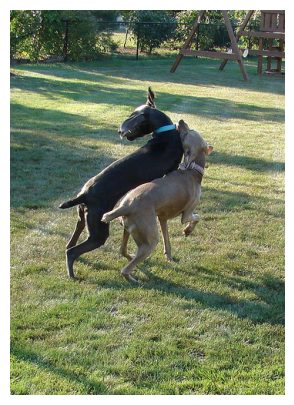

Искомое изображение


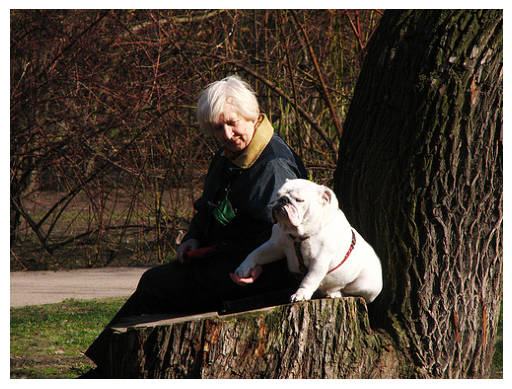

Описание : A playground with two children and an adult .

This image is unavailable in your country in compliance with local laws

Описание : A large bird spreading his wings in flight over a body of water .

Оценка: 0.76974666


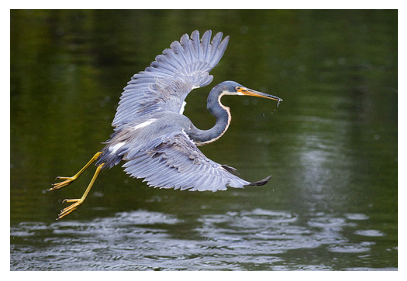

Искомое изображение


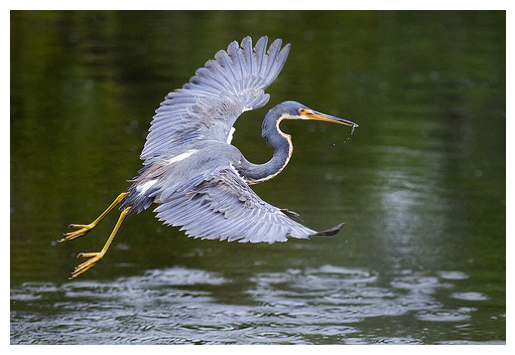

In [74]:
test_vector_text = make_vector_text_df(test_texts, tokenizer, bert_model, device)
    
X_test_final = test_vector_text.assign(x=1).merge(
test_vector_img.assign(x=1)).drop(columns="x")

X_test_to_model = X_test_final.drop(columns=['image', 'query_text'])

# Преобразуем в тензор
X_new_t = torch.FloatTensor(np.array(X_test_to_model))

# Предсказание
net.eval()
with torch.no_grad():
    predictions = net(X_new_t).flatten()

# Преобразуем в numpy и выводим
predictions_np = predictions.numpy()

X_test_final['pred_nc'] = predictions_np
idx = X_test_final.groupby('query_text')['pred_nc'].idxmax()
results = X_test_final.loc[idx]
results = results[['image', 'query_text', 'pred_nc']].copy()

for text in test_query_list:
    try:
        test_res = results[results.query_text==text]
        print('Описание :', text)
        print()
        print('Оценка:', test_res.pred_nc.values[0])
        fig = plt.figure(figsize=(5,5))
        image = Image.open(DIR_PATH +'test_images/' + test_res.image.values[0])
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        print('Искомое изображение')
        tru_result = test_queries_data[test_queries_data.query_text==text].image.values[0]
        image = Image.open(DIR_PATH +'test_images/' + tru_result)
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    except:
        print('This image is unavailable in your country in compliance with local laws')
        print()
        

Что ж, иногда даже удается найти нужное. Ну или хоть немного похожее, для начала весьма неплохо! 

Теперь попробуем решить задачу немного по другому и обратимся к предобученной модели CLIP.

### CLIP

In [75]:
clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

def img_search_clip(test_query_list, clip_model, clip_preprocess):
    for text in test_query_list:
        if filter_age_words(text,AGE_RELATED_WORDS):
            print('This image is unavailable in your country in compliance with local laws')
            print()
        else:
            # Токенизация текста
            text_input = clip.tokenize([text]).to(device)
    
            # Получение текстового embedding
            with torch.no_grad():
                text_features = clip_model.encode_text(text_input)
    
            # Поиск изображения в папке
            best_image_path = None
            best_similarity = -1  # Начальное значение для поиска максимума
    
            for image_name in os.listdir(DIR_PATH + 'test_images'):
                image_path = os.path.join(DIR_PATH + 'test_images', image_name)
                image = preprocess(Image.open(image_path)).unsqueeze(0).to(device)
        
                # Получение изображенческого embedding
                with torch.no_grad():
                    image_features = clip_model.encode_image(image)
        
                # Вычисление косинусного сходства между текстом и изображением
                similarity = (text_features @ image_features.T).item()
        
                # Обновление лучшего изображения
                if similarity > best_similarity:
                    best_similarity = similarity
                    best_image_path = image_path

            fig = plt.figure(figsize=(5,5))
            print('Описание:', text)
            image = Image.open(best_image_path)
            plt.imshow(image)
            plt.axis('off')
            plt.show()
            print()
            print('Искомое изображение')
            tru_result = test_queries_data[test_queries_data.query_text==text].image.values[0]
            image = Image.open(DIR_PATH +'test_images/' + tru_result)
            plt.imshow(image)
            plt.axis('off')
            plt.show()
            

100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 125MiB/s]


Описание: Costumed performers stand onstage with their arms outstretched .


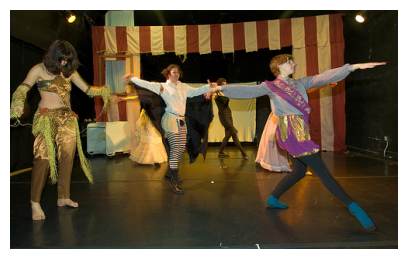


Искомое изображение


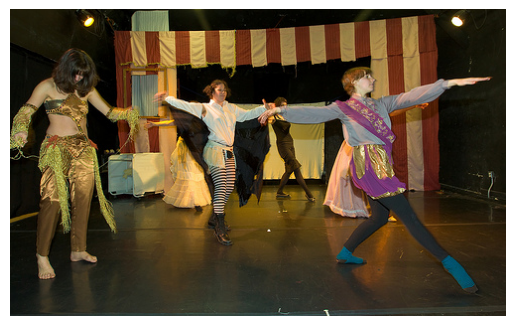

Описание: The brown dog is wearing a black collar .


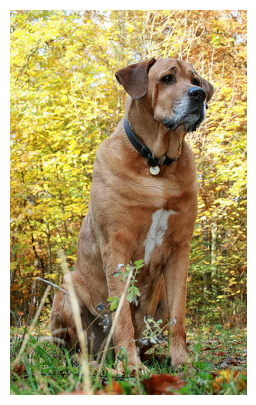


Искомое изображение


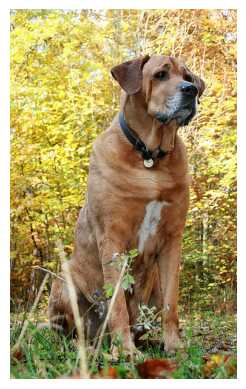

Описание: a large man dozes off on the bus .


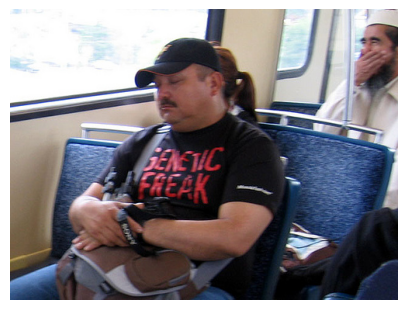


Искомое изображение


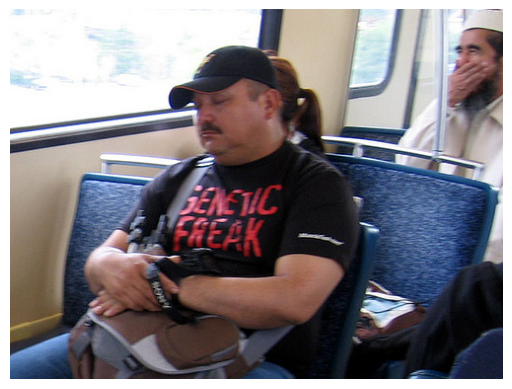

This image is unavailable in your country in compliance with local laws

This image is unavailable in your country in compliance with local laws

Описание: a lone man sitting on a ledge that overlooks the beach


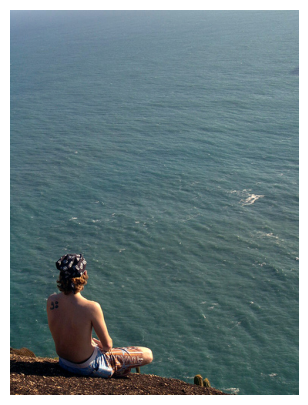


Искомое изображение


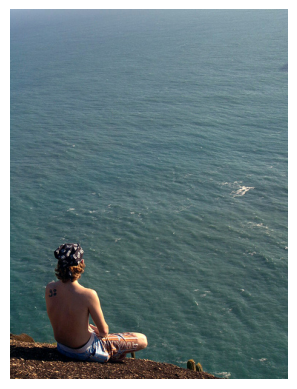

Описание: A group of people playing instruments in the woods .


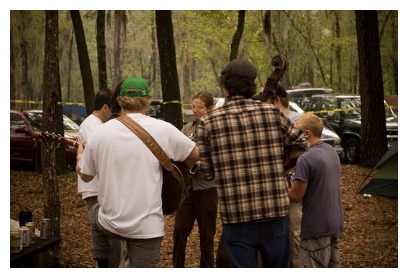


Искомое изображение


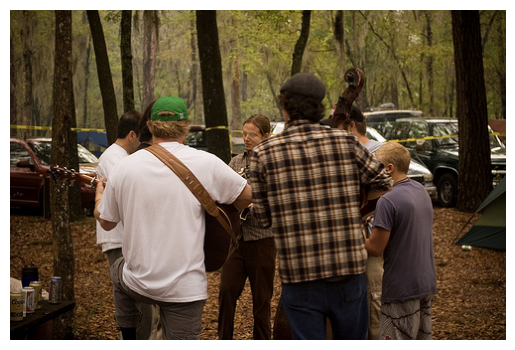

Описание: There is an older white haired lady and a bulldog sitting on a tree stump .


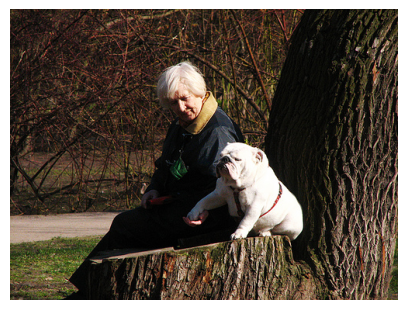


Искомое изображение


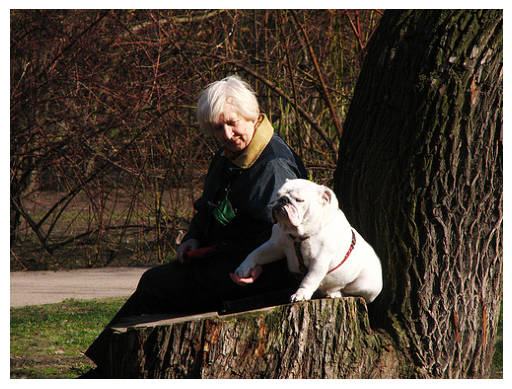

This image is unavailable in your country in compliance with local laws

Описание: A large bird spreading his wings in flight over a body of water .


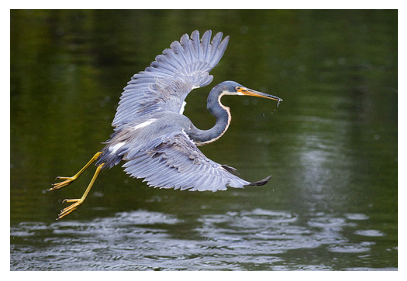


Искомое изображение


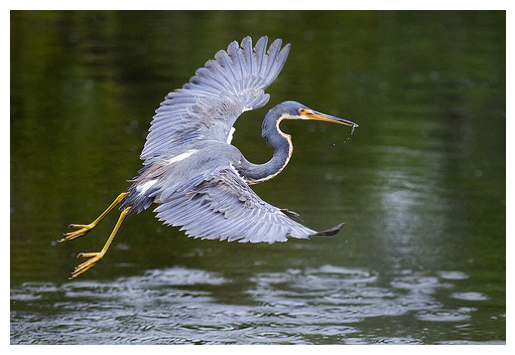

In [76]:
img_search_clip(test_query_list, clip_model, clip_preprocess)

Вот он результат, которого мы хотели добиться. Задача в целом решена, хоть и не так как планировалось изначально.

# Итоговые выводы:
- загружены имеющиеся данные из 4 файлов и 2 папок;
 - проведен анализ данных :
    - пропуски данных не обнаружены,
    - рассмотрели распределение количественных признаков;
    - пропусков в данных не обнаружено, типизация данных во всех датафреймах корректна;
- провели визуальный осмотр корректности оценок,
- собрали датасет для моделирования из данных и экспертных оценок (исключили оценки ураудсорса как малоинформативные),
- удалили изображения с детьми как требовалось в ТЗ,
- векторизовали изображения и тексты при помощи предобученных моделей resnet18 и BERT,
- обучили 4 модели и базовую модель,
- по метрике RMSE определили как лучшую модель многослойную нейросеть,
- протестировали лучшую модель и оценили результат ее работы, пока он весьма посредственный но периодически она находит необходимые фото, значит нужно работать над ней дальше!
- добились необходимого результата при помощи предобученной модели CLIP.


## Выводы

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Исследовательский анализ данных выполнен
- [x]  Проверены экспертные оценки и краудсорсинговые оценки
- [x]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [x]  Изображения векторизованы
- [x]  Текстовые запросы векторизованы
- [x]  Данные корректно разбиты на тренировочную и тестовую выборки
- [x]  Предложена метрика качества работы модели
- [x]  Предложена модель схожести изображений и текстового запроса
- [x]  Модель обучена
- [x]  По итогам обучения модели сделаны выводы
- [x]  Проведено тестирование работы модели
- [x]  По итогам тестирования визуально сравнили качество поиска